<a href="https://colab.research.google.com/github/tamojeetroychowdhury/CAB-Assignment/blob/main/SDSS_Gaia_check.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install astroquery

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 4.5 MB 4.7 MB/s 
     |████████████████████████████████| 885 kB 40.6 MB/s 
     |████████████████████████████████| 48 kB 4.3 MB/s 
     |████████████████████████████████| 4.1 MB 41.3 MB/s 


In [3]:
from astroquery.sdss import SDSS
#from specutils import Spectrum1D
from astropy import coordinates as coords
import matplotlib.pyplot as plt
import numpy as np
from astropy import units as u

/usr/local/lib/python3.8/dist-packages/astroquery/sdss/core.py:874: VisibleDeprecationWarning: Reading unicode strings without specifying the encoding argument is deprecated. Set the encoding, use None for the system default.
  arr = np.atleast_1d(np.genfromtxt(io.BytesIO(response.content),


       ra              dec        ...      specobjid       run2d 
---------------- ---------------- ... ------------------- -------
229.747135707582  2.1954057206664 ... 4516183082735214592 v5_10_0
229.784503306872 2.15010024592839 ... 4516188030537539584 v5_10_0
 229.82429626039 2.01389544097256 ... 4516071757182902272 v5_10_0
 229.73450614382 2.25733609319336 ... 4516172087618936832 v5_10_0
229.801407688371 2.12407011367967 ... 3323794315318159360      26
229.702017312127 2.23760555034977 ... 3323797888730949632      26
229.749327017605 2.24129751497819 ... 3323799263120484352      26
229.776335587889 2.21616625381863 ... 4516184457124749312 v5_10_0
229.796877578277 2.08735357610147 ... 4516072581816623104 v5_10_0
 229.76861410946 2.24864439116934 ... 3323798163608856576      26
             ...              ... ...                 ...     ...
229.823642188757 2.20531047823649 ... 4516185006880563200 v5_10_0
229.557111016691 2.22641292075992 ... 3323797064097228800      26
229.788338

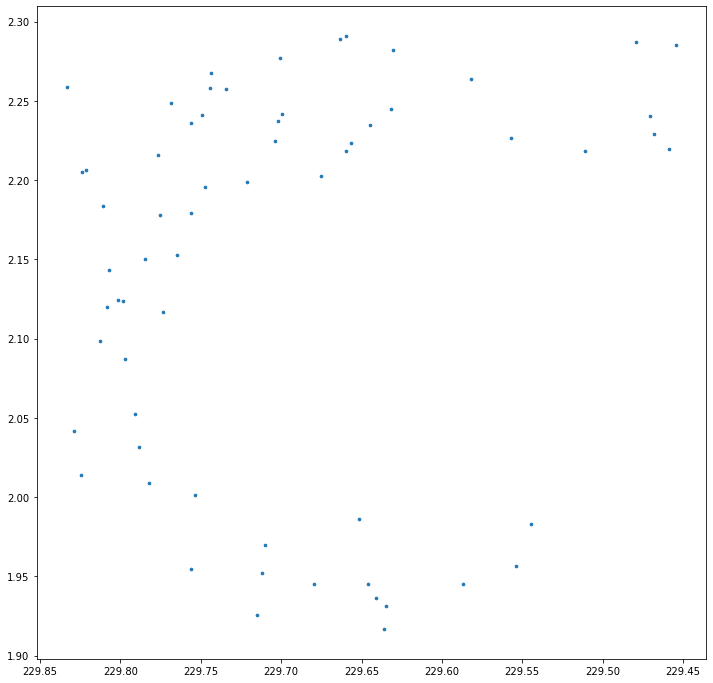

In [4]:
pos = coords.SkyCoord('15h18m33.75s 02d05m57.7s', frame='gcrs')
xid_spec = SDSS.query_region(pos, radius = '11.5m', spectro=True)
print(xid_spec)

plt.figure(figsize=(12,12))
plt.scatter(xid_spec['ra'],xid_spec['dec'],s=7)
plt.gca().invert_xaxis()
plt.show()

42174


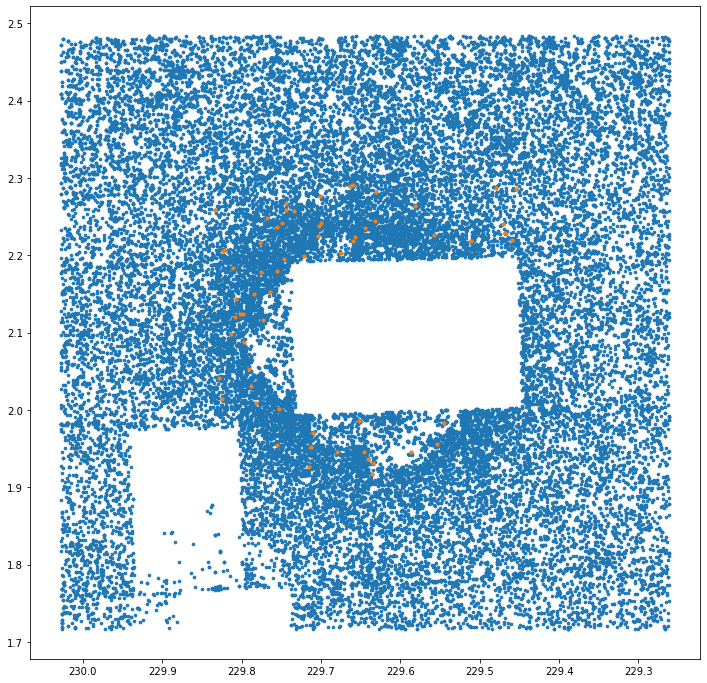

In [ ]:
pos = coords.SkyCoord('15h18m33.75s 02d05m57.7s', frame='gcrs')
xid = SDSS.query_region(pos, radius = '23m')#, spectro=True)
print(len(xid))

plt.figure(figsize=(12,12))
plt.scatter(xid['ra'],xid['dec'],s=7)
plt.scatter(xid_spec['ra'],xid_spec['dec'],s=10)
plt.gca().invert_xaxis()
plt.show()

INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]


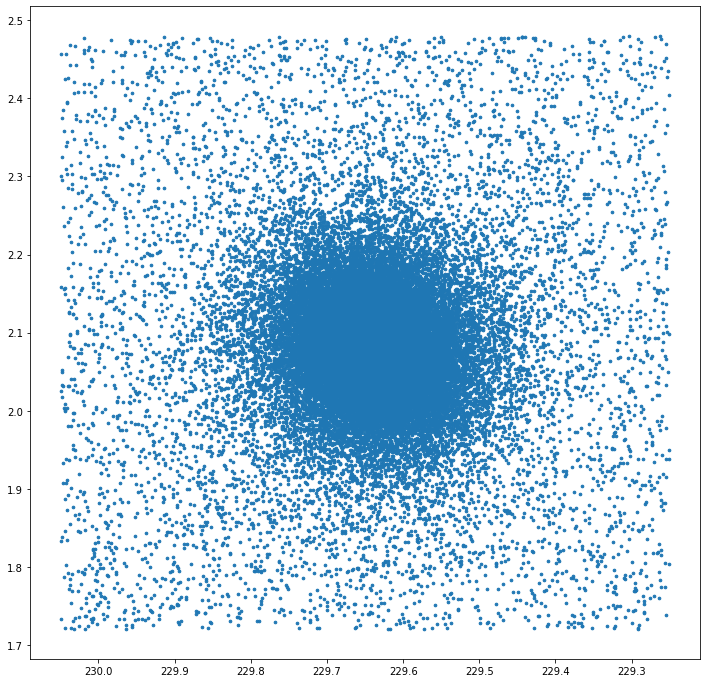

In [ ]:
from astroquery.gaia import Gaia
query = '''select top 200000 ra, dec from gaiadr3.gaia_source
where ra between 229.25 and 230.05 and dec between 1.72 and 2.48'''

job = Gaia.launch_job_async(query)
r = job.get_results()

plt.figure(figsize=(12,12))
plt.scatter(r['ra'],r['dec'],s=7)
plt.gca().invert_xaxis()
plt.show()

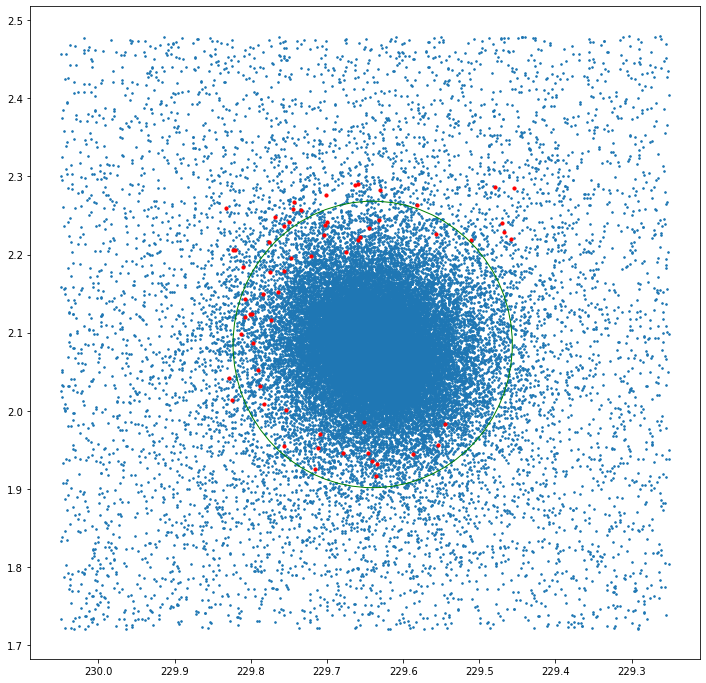

In [ ]:
fig, ax = plt.subplots(figsize=(12,12))
plt.scatter(r['ra'],r['dec'],s=2.5)

plt.scatter(xid_spec['ra'],xid_spec['dec'],s=10, color = 'red')
c = plt.Circle((229.64,2.085),11/60,color='g',fill=False)
ax.add_patch(c)

plt.gca().invert_xaxis()
plt.show()

In [5]:
d = xid_spec
mask = (d['ra']-229.64)**2 + (d['dec']-2.085)**2 <= (11/60)**2
x = d[mask]

In [11]:
from astroquery.gaia import Gaia

for i in range(len(x)):
  query = f'''SELECT TOP 3 ra, dec, parallax, parallax_over_error
  FROM gaiadr3.gaia_source 
  WHERE 
  CONTAINS(
    POINT('ICRS',gaiadr3.gaia_source.ra,gaiadr3.gaia_source.dec),
    CIRCLE('ICRS',{x['ra'][i]},{x['dec'][i]},0.0001388888888888889)
  )=1'''

  job = Gaia.launch_job_async(query)
  r = job.get_results()

  print(len(r))
  if len(r)>0:
    print(np.reciprocal(r['parallax'][0])*1000, r['parallax_over_error'][0])



INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
2261.720362325276 1.5838593


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
1692.3963826178792 1.7501026


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
-- --


<ipython-input-11-74f755b0305c>:17: RuntimeWarning: divide by zero encountered in reciprocal
  print(np.reciprocal(r['parallax'][0])*1000, r['parallax_over_error'][0])
INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
1028.3485358165467 10.854587


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
-14980.819917704463 -0.11270559


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
-9626.611615934318 -0.6098593


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
0


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
1801.8709424730275 0.9567427


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
592.9599148316886 2.459406


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
-27294.72118340202 -0.04092387


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
-3280.4308211113166 -0.37758592


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
0


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
4075.345636106448 1.4432812


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
1598.967141096286 11.770556


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
0


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
0


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
1843.152290537076 1.6138465


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
3215.4095248185117 1.2363449


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
0


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
0


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
-- --


<ipython-input-11-74f755b0305c>:17: RuntimeWarning: divide by zero encountered in reciprocal
  print(np.reciprocal(r['parallax'][0])*1000, r['parallax_over_error'][0])
INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
6085.683735145498 1.2706401


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
0


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
3038.4859428326863 1.9012402


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
-305.3411018682381 -2.4888053


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
0


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
0


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
-- --


<ipython-input-11-74f755b0305c>:17: RuntimeWarning: divide by zero encountered in reciprocal
  print(np.reciprocal(r['parallax'][0])*1000, r['parallax_over_error'][0])
INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
1445.4294939999982 2.7885334


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
17429.520463298813 0.25241807


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
-12619.841411494273 -0.5078809


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
355.0471390825331 2.070344


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
-- --


<ipython-input-11-74f755b0305c>:17: RuntimeWarning: divide by zero encountered in reciprocal
  print(np.reciprocal(r['parallax'][0])*1000, r['parallax_over_error'][0])
INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
0


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
-895.1788104230823 -0.974921


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
35174.97736334522 0.34103087


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
5130.969009574815 1.2426237


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
1688.145247108698 6.7645006


INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
1
2578.6201651270017 1.9470712


In [ ]:
s = SDSS.get_spectra(matches = x)

In [ ]:
# 5581, 7202, 7148 of calcium+1, also 4227 present where 5581 isn't
# 7231, 7236 of carbon, not present
# 7180 of H2O, not present
# 8407 of TiO - present in many!
# 3883 of cyanide - present in many! 4215 of cyanide - present in several as very short peak
# 7250 of Si+ - found in two
# 7601 of Ca++, found as broad peak in some
# 7657 of Mg+, long peak in image 25, short peak in 17, almost-peak in third
# 8184, 8194 of N+, Na+ small peaks in several, mostly first line
# 8213, 8221, 8234 of Mg,O,Mg have smaller peaks in few
# 6300 (can be O or Fe but seem Fe looking at Sneden et al) line present in many! 6158 Fe+ line also present in several, mainly in images towards end
# 6154, 6161 Na lines in several, two as prominent peaks in end
# 6300 zoom-in resolution : Fe line 6301.5 present in many, several have zig-zag or two-point peaks which means both O and Fe peaks present.

In [ ]:
import warnings
warnings.simplefilter('ignore')
from scipy.signal import find_peaks
from specutils.fitting import fit_generic_continuum

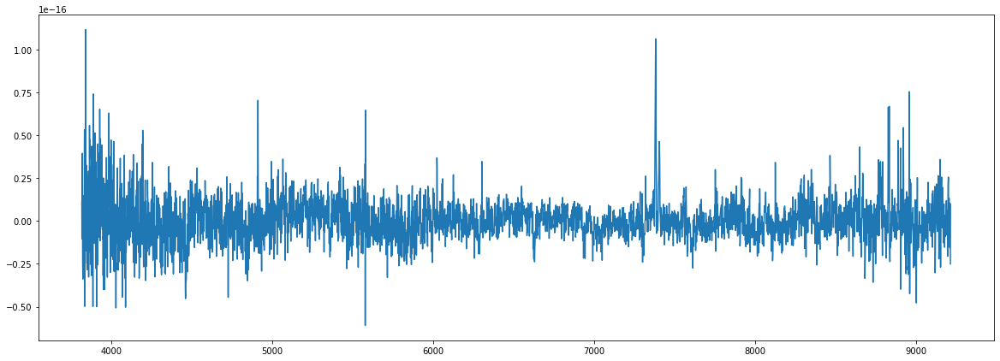

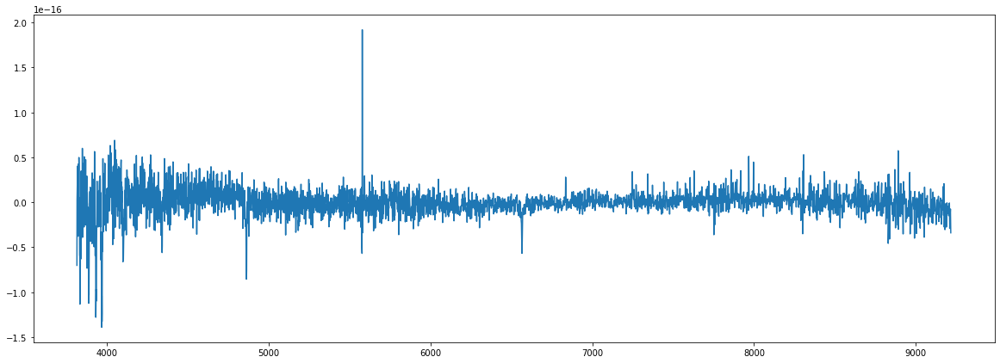

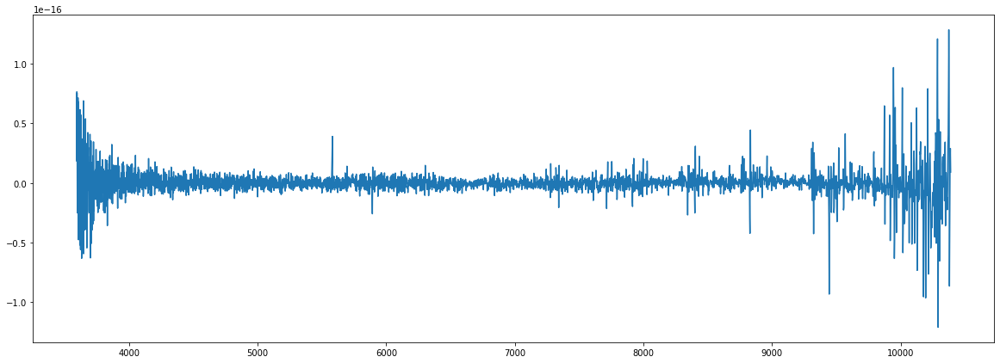

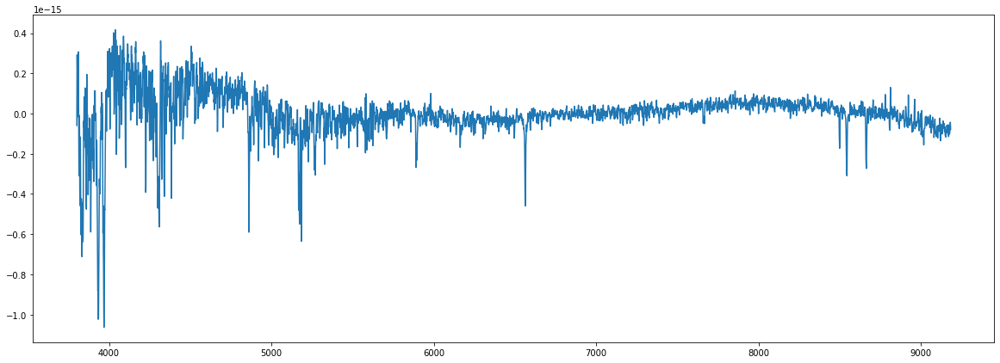

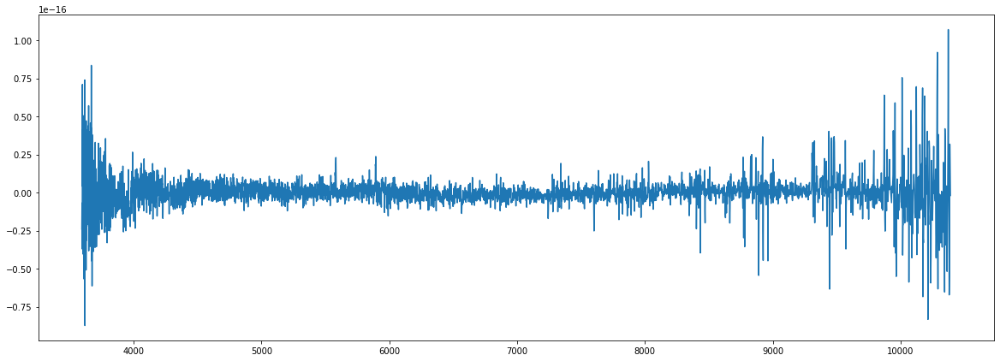

...

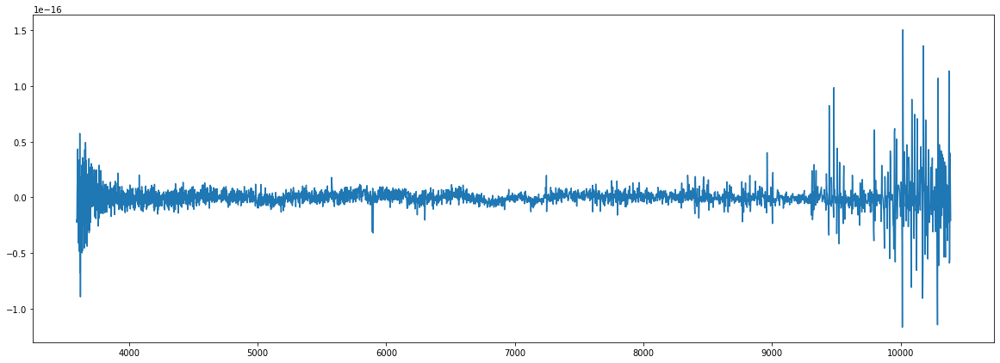

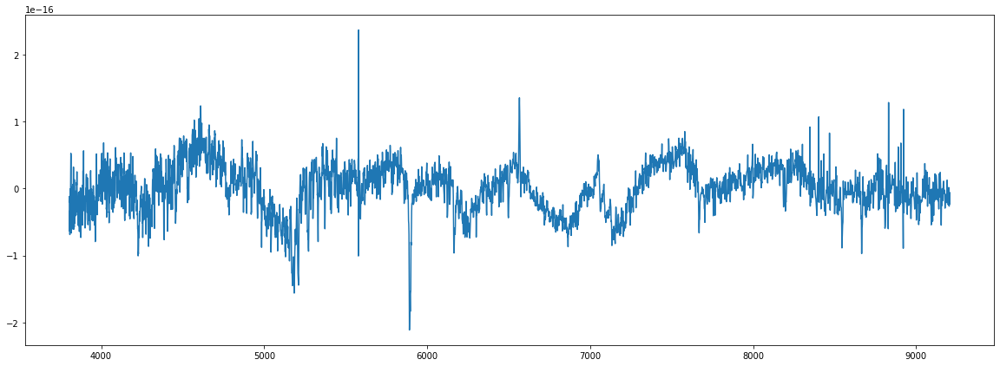

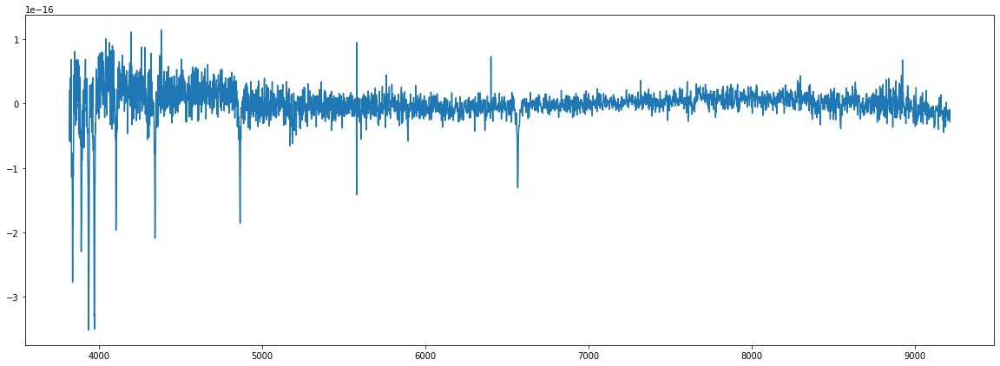

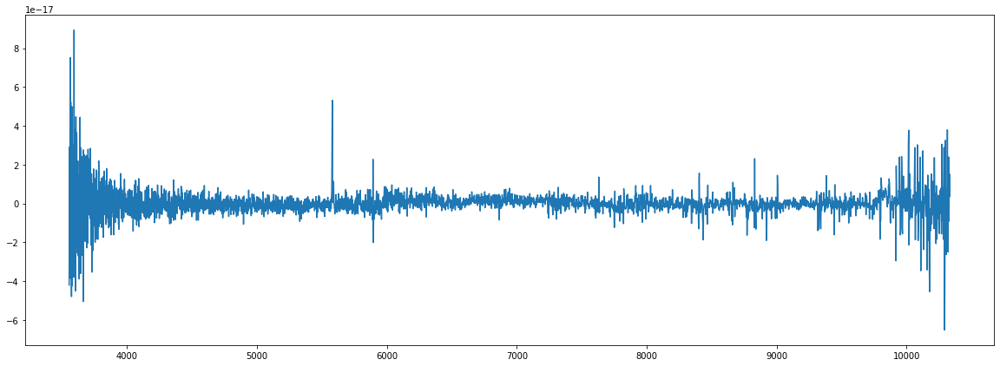

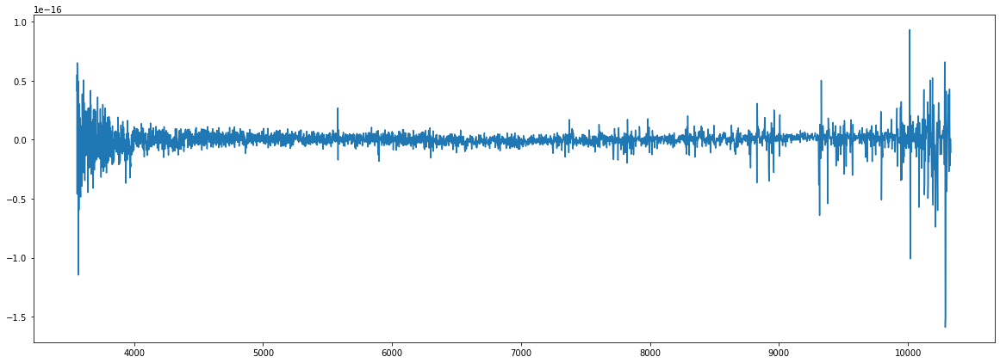

In [ ]:
for i in range(len(s)):
  specdata = s[i][1].data
  lamb = 10**specdata['loglam'] * u.AA 
  flux = specdata['flux'] * 10**-17 * u.Unit('erg cm-2 s-1 AA-1') 
  spec = Spectrum1D(spectral_axis=lamb, flux=flux)

  g1_fit = fit_generic_continuum(spec)
  y_continuum_fitted = g1_fit(lamb)

  spec -= y_continuum_fitted

  fig, ax = plt.subplots(figsize = (20,7))  
  ax.plot(spec.spectral_axis, spec.flux) 

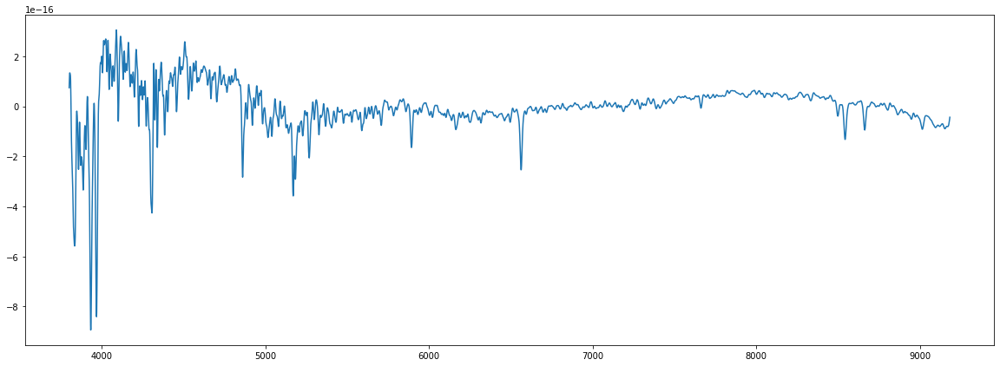

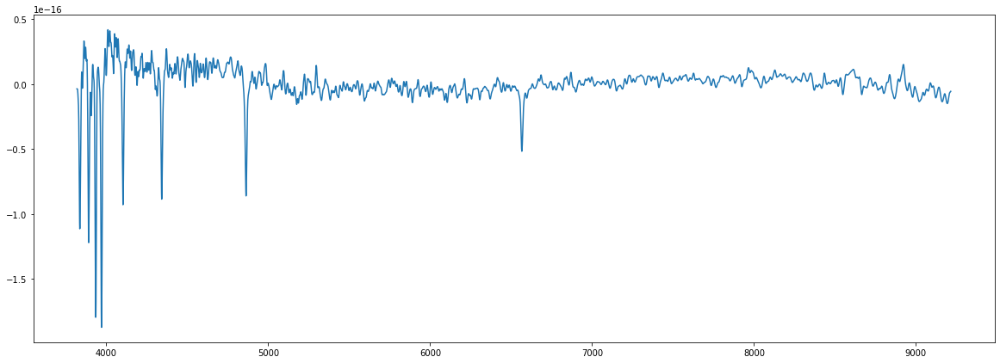

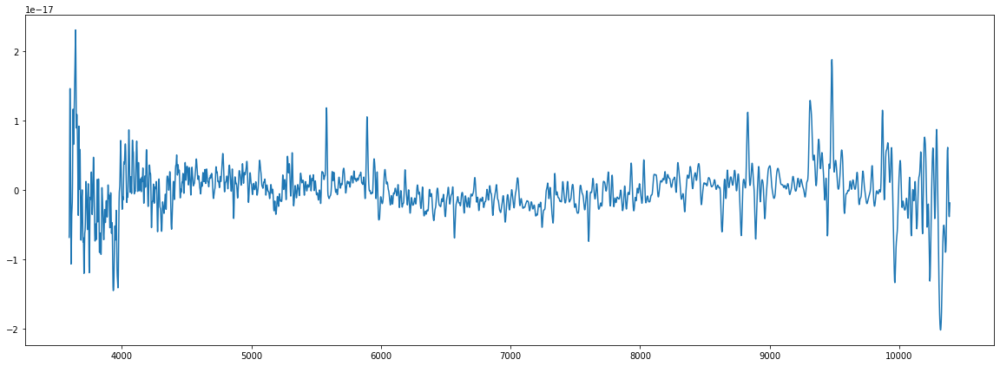

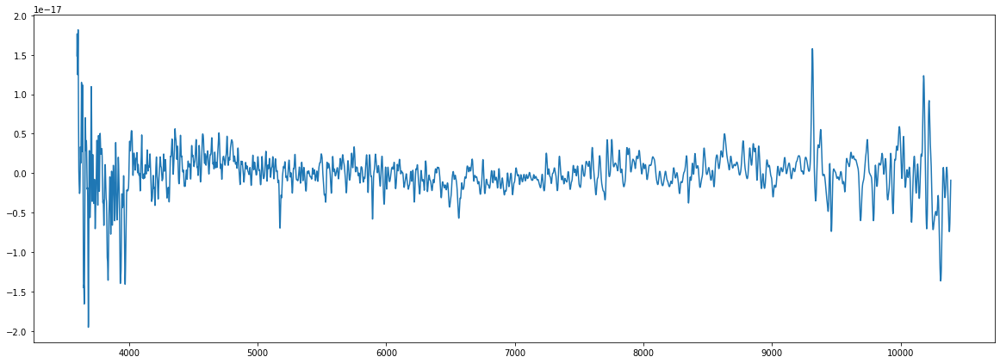

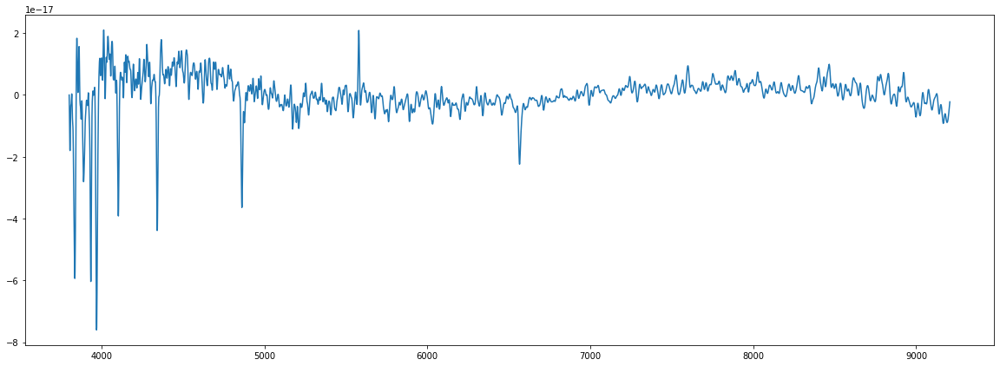

...

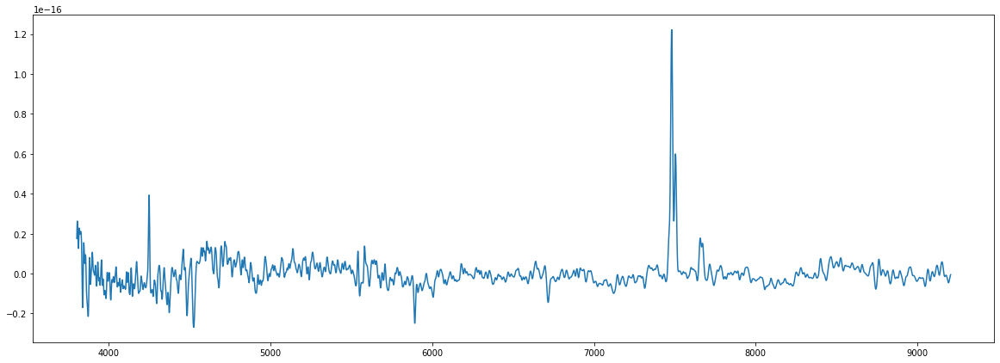

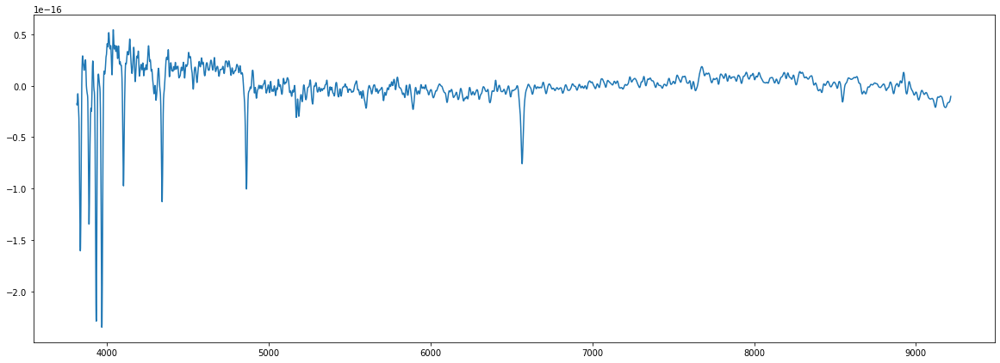

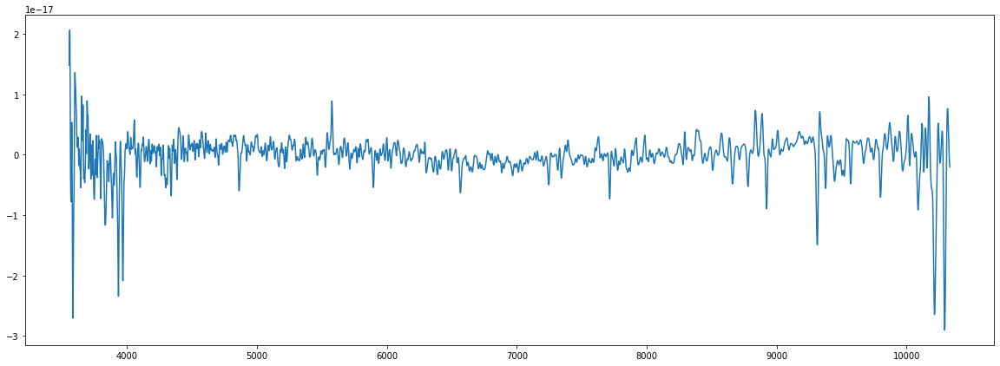

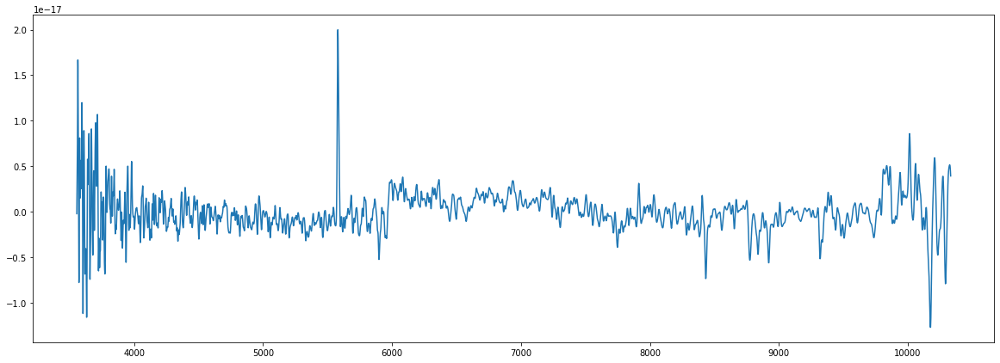

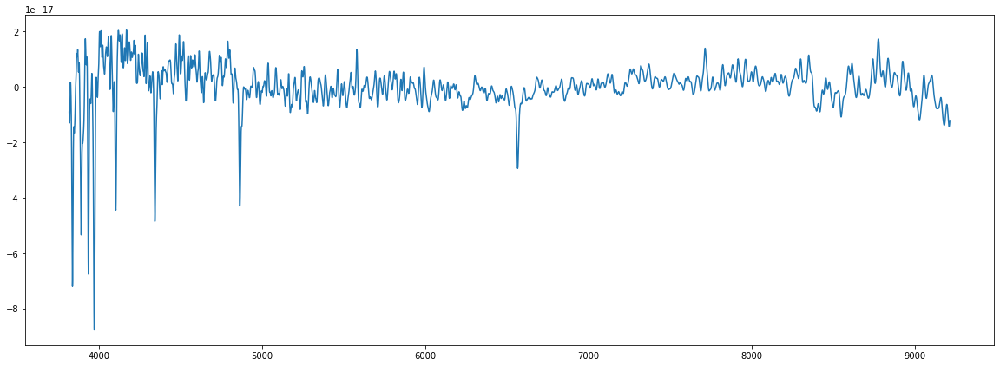

In [ ]:
for i in range(len(s)):
  specdata = s[i][1].data
  lamb = 10**specdata['loglam'] * u.AA 
  flux = specdata['flux'] * 10**-17 * u.Unit('erg cm-2 s-1 AA-1') 
  spec = Spectrum1D(spectral_axis=lamb, flux=flux)

  g1_fit = fit_generic_continuum(spec)
  y_continuum_fitted = g1_fit(lamb)

  spec -= y_continuum_fitted
  spec = gaussian_smooth(spec, stddev=3)
  
  fig, ax = plt.subplots(figsize = (20,7))  
  ax.plot(spec.spectral_axis, spec.flux)

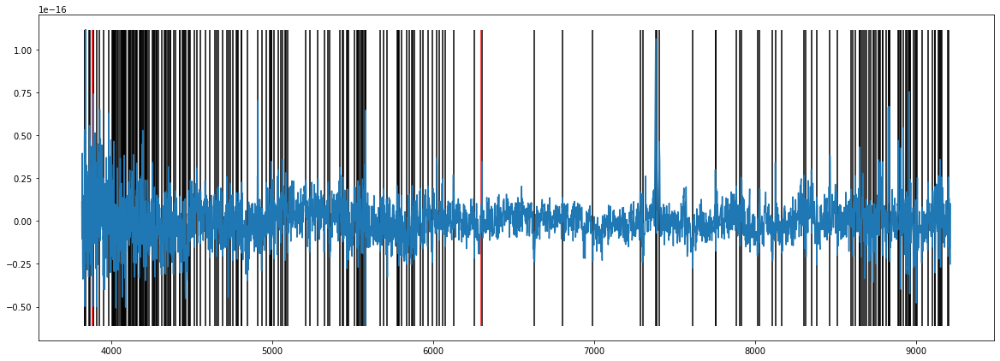

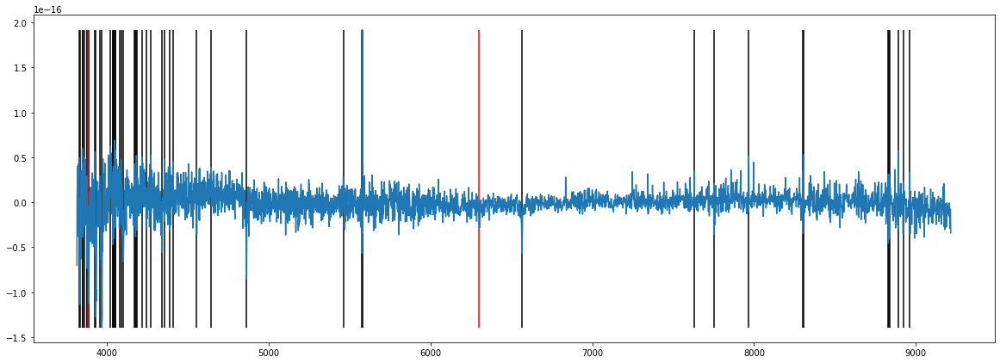

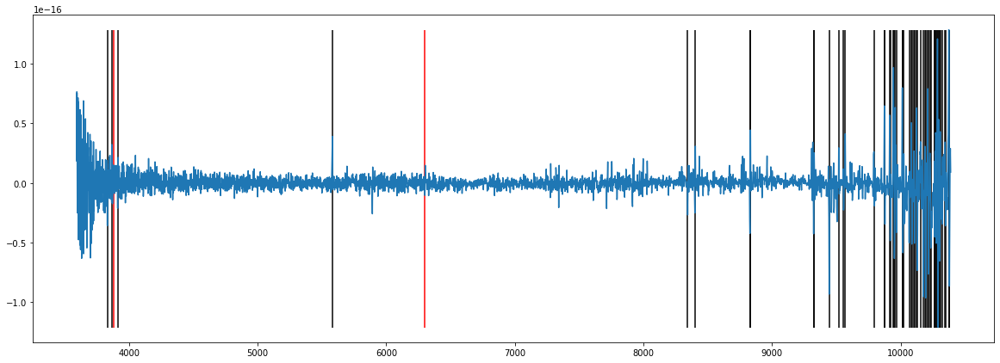

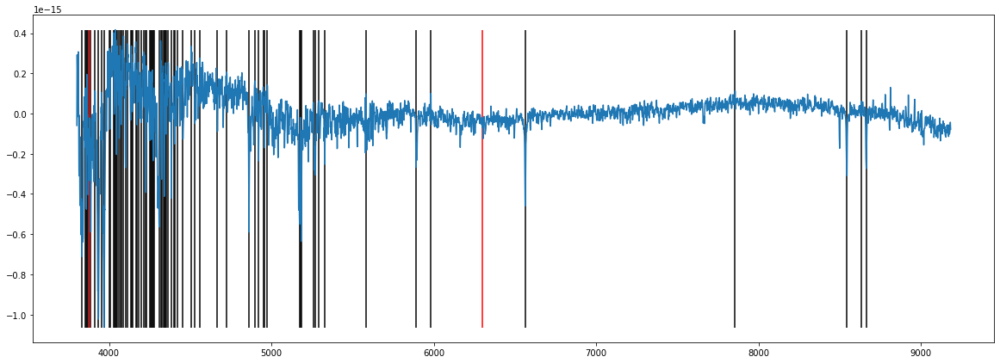

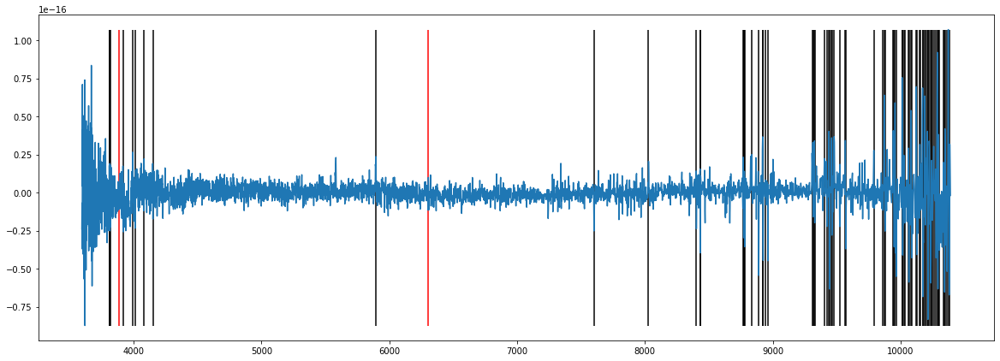

...

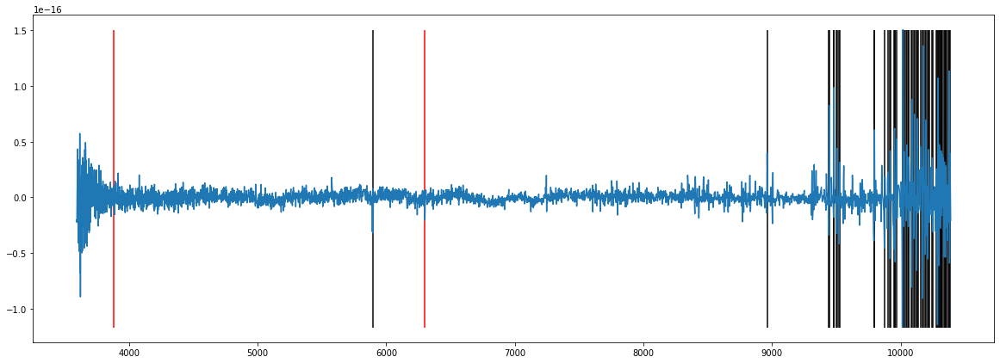

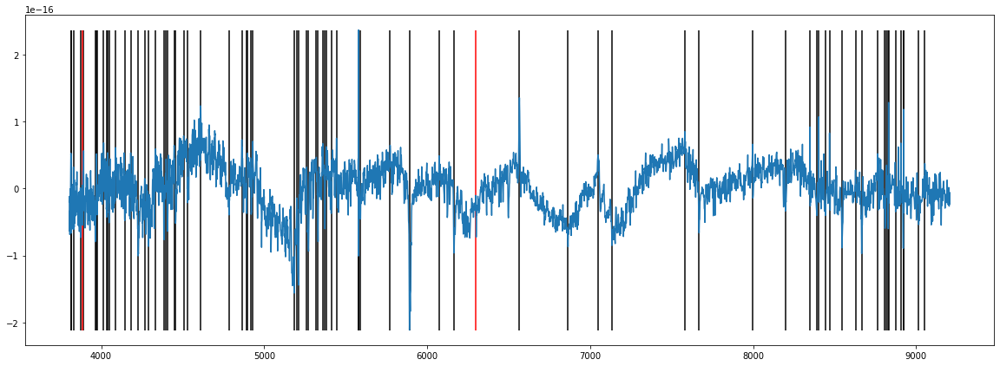

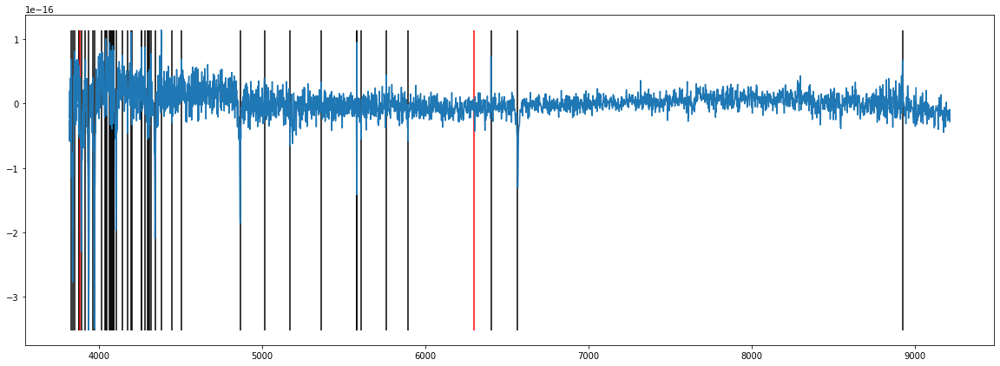

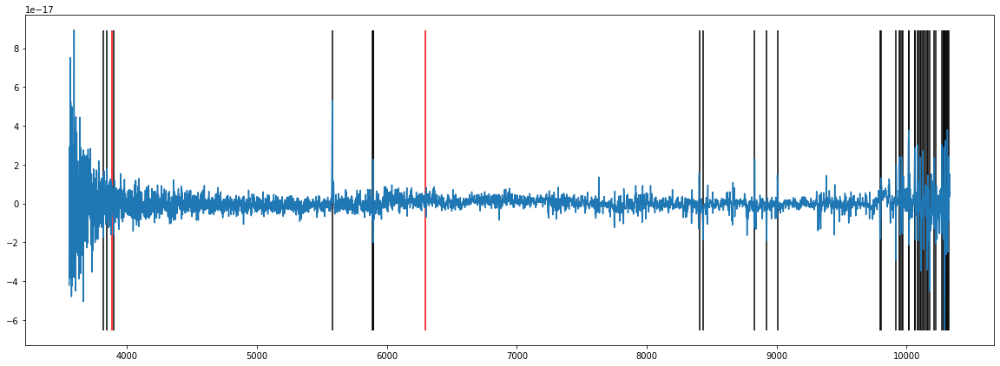

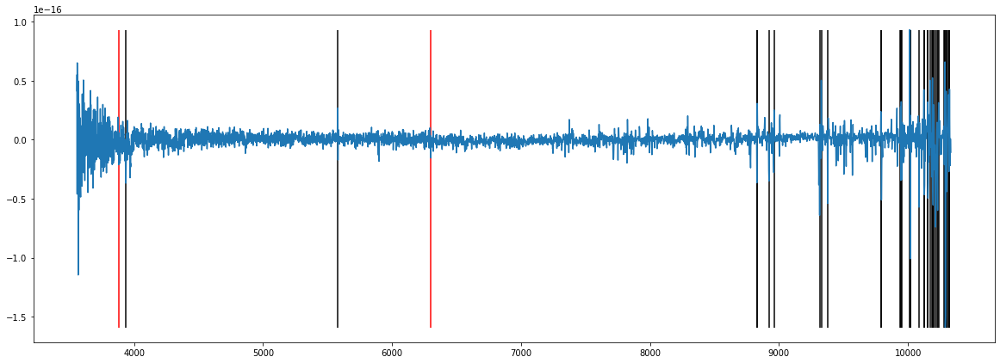

In [ ]:
from specutils.manipulation import gaussian_smooth

for i in range(len(s)):
  specdata = s[i][1].data
  lamb = 10**specdata['loglam'] * u.AA 
  flux = specdata['flux'] * 10**-17 * u.Unit('erg cm-2 s-1 AA-1') 
  spec = Spectrum1D(spectral_axis=lamb, flux=flux)

  g1_fit = fit_generic_continuum(spec)
  y_continuum_fitted = g1_fit(lamb)

  spec -= y_continuum_fitted
  #spec = gaussian_smooth(spec, stddev=3)

  d = np.array(spec.flux)
  d = d[~np.isnan(d)]
  h = (np.max(d) - np.min(d))/5
  p1 = find_peaks(d, prominence = h)
  p2 = find_peaks(-d, prominence = h)
  l_full = np.array(spec.spectral_axis)[np.concatenate((p1[0],p2[0]))]
  
  i = 5
  l_start = l_full[np.where(np.abs(l_full - 3900) < 100)]
  while len(l_start) > 15:
    i -= 0.5
    h = (np.max(d) - np.min(d))/i
    p1 = find_peaks(d, prominence = h)
    p2 = find_peaks(-d, prominence = h)
    l_intm = np.array(spec.spectral_axis)[np.concatenate((p1[0],p2[0]))]
    l_start = l_intm[np.where(np.abs(l_intm - 3900) < 100)]

  l = np.concatenate((l_start, l_full[np.where(l_full >= 4000)]))
  fig, ax = plt.subplots(figsize = (20,7))  
  ax.plot(spec.spectral_axis, spec.flux)
  ax.vlines(l,np.min(np.array(spec.flux)),np.max(np.array(spec.flux)))
  ax.vlines([6300,3883],np.min(np.array(spec.flux)),np.max(np.array(spec.flux)), color='r') 

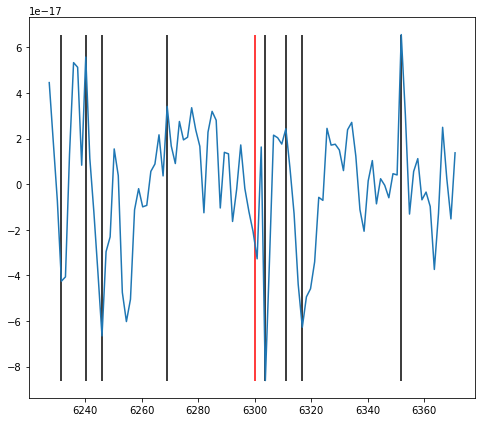

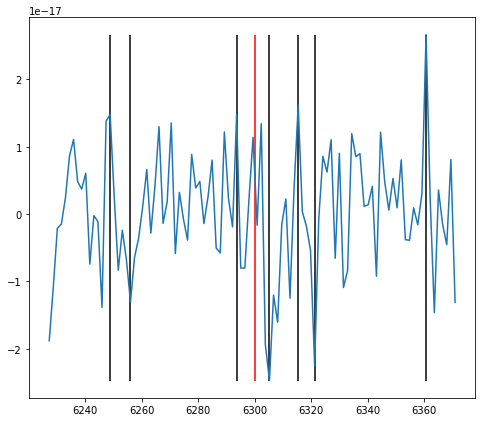

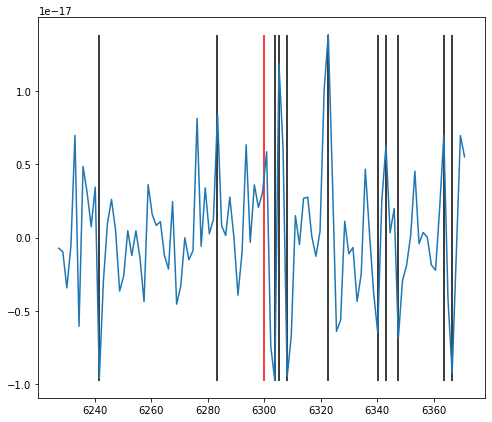

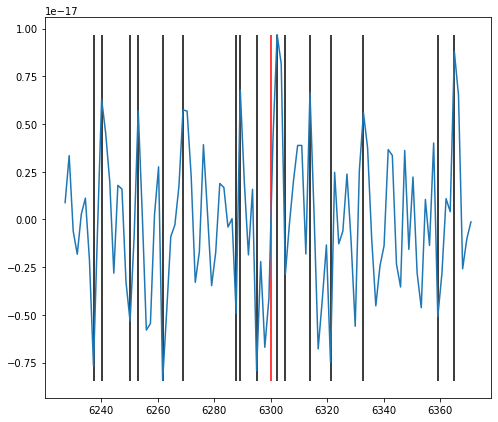

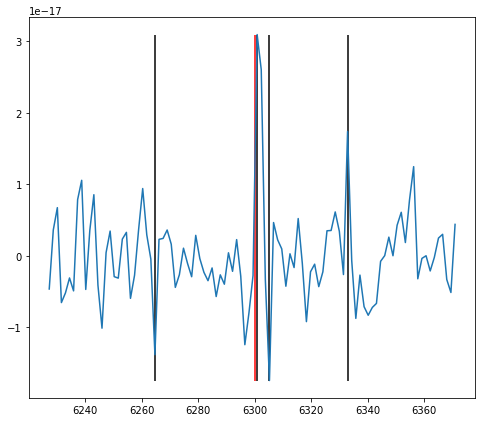

...

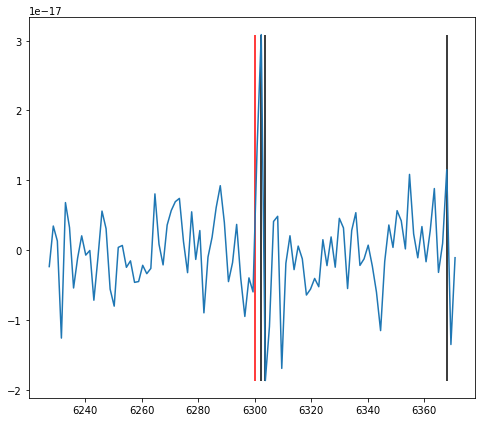

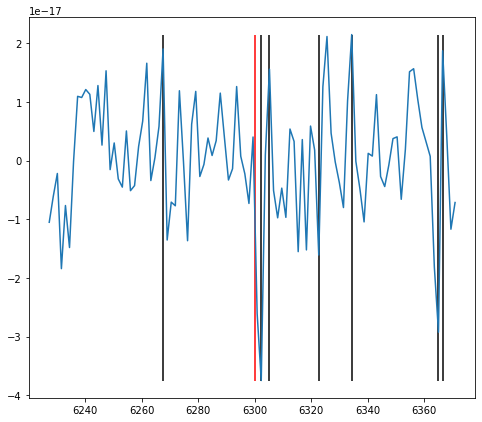

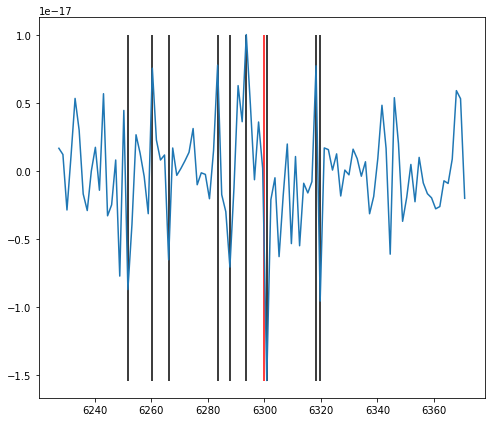

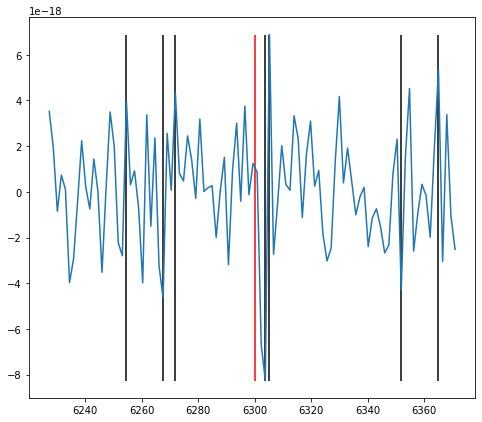

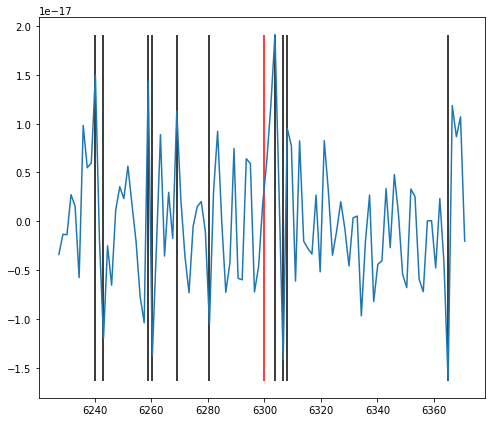

In [ ]:
for i in range(len(s)):
  specdata = s[i][1].data
  lamb = 10**specdata['loglam']
  nearest = f(lamb, lamb, 6300)
  mid = int(np.where(lamb == nearest)[0])
  specdata = specdata[mid-50:mid+50]

  lamb = 10**specdata['loglam'] * u.AA
  flux = specdata['flux'] * 10**-17 * u.Unit('erg cm-2 s-1 AA-1') 
  spec = Spectrum1D(spectral_axis=lamb, flux=flux)

  g1_fit = fit_generic_continuum(spec)
  y_continuum_fitted = g1_fit(lamb)

  spec -= y_continuum_fitted
  #spec = gaussian_smooth(spec, stddev=3)

  d = np.array(spec.flux)
  d = d[~np.isnan(d)]
  h = (np.max(d) - np.min(d))/2
  p1 = find_peaks(d, prominence = h)
  p2 = find_peaks(-d, prominence = h)
  l = np.array(spec.spectral_axis)[np.concatenate((p1[0],p2[0]))]
  
  fig, ax = plt.subplots(figsize = (8,7))  
  ax.plot(spec.spectral_axis, spec.flux)
  ax.vlines(l,np.min(np.array(spec.flux)),np.max(np.array(spec.flux)))
  ax.vlines([6300],np.min(np.array(spec.flux)),np.max(np.array(spec.flux)), color='r')

In [ ]:
o = []

for i in range(len(s)):
  specdata = s[i][1].data
  lamb = 10**specdata['loglam']
  nearest = f(lamb, lamb, 6300)
  mid = int(np.where(lamb == nearest + np.mean(lamb))[0])
  specdata = specdata[mid-50:mid+50]

  lamb = 10**specdata['loglam'] * u.AA
  flux = specdata['flux'] * 10**-17 * u.Unit('erg cm-2 s-1 AA-1') 
  spec = Spectrum1D(spectral_axis=lamb, flux=flux)

  g1_fit = fit_generic_continuum(spec)
  y_continuum_fitted = g1_fit(lamb)

  spec -= y_continuum_fitted
  #spec = gaussian_smooth(spec, stddev=3)

  d = np.array(spec.flux)
  d = d[~np.isnan(d)]
  h = (np.max(d) - np.min(d))/5
  p1 = find_peaks(d, prominence = h)
  p2 = find_peaks(-d, prominence = h)
  l = np.array(spec.spectral_axis)[np.concatenate((p1[0],p2[0]))]
  
  nearest = f(l,l,6300.7)  + np.mean(l)
  if np.abs(nearest - 6300.7)<1:
    o_flux = np.abs(f(l,np.array(spec.flux),6300))
    o_flux_rel = o_flux/h
    o.append(o_flux_rel)
  else:
    o.append(-0.1-0.001*i)

In [ ]:
na = []

for i in range(len(s)):
  specdata = s[i][1].data
  lamb = 10**specdata['loglam']
  nearest = f(lamb, lamb, 6161)
  mid = int(np.where(lamb == nearest + np.mean(lamb))[0])
  specdata = specdata[mid-50:mid+50]

  lamb = 10**specdata['loglam'] * u.AA
  flux = specdata['flux'] * 10**-17 * u.Unit('erg cm-2 s-1 AA-1') 
  spec = Spectrum1D(spectral_axis=lamb, flux=flux)

  g1_fit = fit_generic_continuum(spec)
  y_continuum_fitted = g1_fit(lamb)

  spec -= y_continuum_fitted
  #spec = gaussian_smooth(spec, stddev=3)

  d = np.array(spec.flux)
  d = d[~np.isnan(d)]
  h = (np.max(d) - np.min(d))/5
  p1 = find_peaks(d, prominence = h)
  p2 = find_peaks(-d, prominence = h)
  l = np.array(spec.spectral_axis)[np.concatenate((p1[0],p2[0]))]
  
  nearest = f(l,l,6161) + np.mean(l)
  if np.abs(nearest - 6161)<1:
    na_flux = np.abs(f(l,np.array(spec.flux),6161))
    na_flux_rel = na_flux/h
    na.append(na_flux_rel)
  else:
    na.append(-0.1-0.001*i)

In [ ]:
def f(array, a2, value):
  idx = (np.abs(array-value)).argmin()
  return (a2[idx] - np.mean(a2))

In [ ]:
cn = []

for i in range(len(s)):

  specdata = s[i][1].data
  lamb = 10**specdata['loglam'] * u.AA 
  flux = specdata['flux'] * 10**-17 * u.Unit('erg cm-2 s-1 AA-1') 
  spec = Spectrum1D(spectral_axis=lamb, flux=flux)

  g1_fit = fit_generic_continuum(spec)
  y_continuum_fitted = g1_fit(lamb)

  spec -= y_continuum_fitted
  #spec = gaussian_smooth(spec, stddev=3)

  d = np.array(spec.flux)
  d = d[~np.isnan(d)]
  h = (np.max(d) - np.min(d))/4
  p1 = find_peaks(d, prominence = h)
  p2 = find_peaks(-d, prominence = h)
  l = np.array(spec.spectral_axis)[np.concatenate((p1[0],p2[0]))]

  nearest = f(l,l,3839) + np.mean(l)
  if np.abs(nearest - 3839)<4:
    cn_flux = np.abs(f(l,np.array(spec.flux),3839))
    cn_flux_rel = cn_flux/h
    cn.append(cn_flux_rel)
  else:
    cn.append(-0.1-0.001*i)

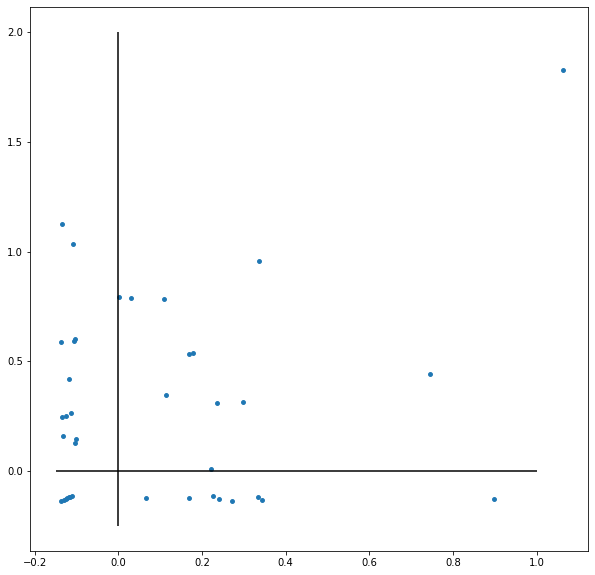

In [ ]:
plt.figure(figsize=(10,10))
plt.scatter(cn,o,s=15)
plt.hlines([0],-0.15,1)
plt.vlines([0],-0.25,2)
plt.show()

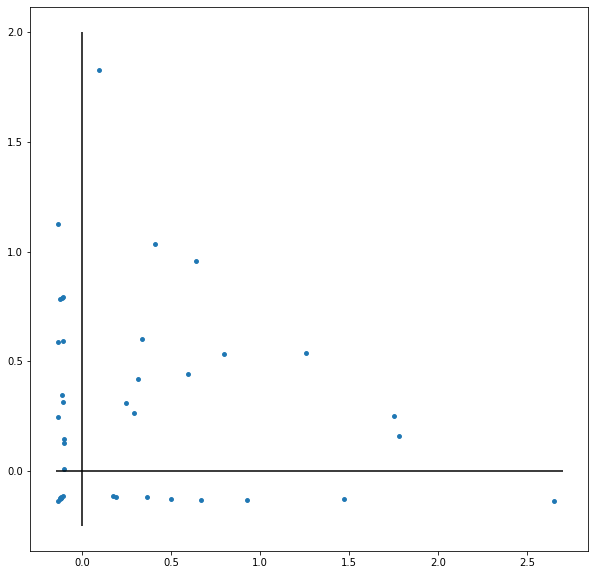

In [ ]:
plt.figure(figsize=(10,10))
plt.scatter(na,o,s=15)
plt.hlines([0],-0.15,2.7)
plt.vlines([0],-0.25,2)
plt.show()

In [ ]:
ca = []

for i in range(len(s)):

  specdata = s[i][1].data
  lamb = 10**specdata['loglam'] * u.AA 
  flux = specdata['flux'] * 10**-17 * u.Unit('erg cm-2 s-1 AA-1') 
  spec = Spectrum1D(spectral_axis=lamb, flux=flux)

  g1_fit = fit_generic_continuum(spec)
  y_continuum_fitted = g1_fit(lamb)

  spec -= y_continuum_fitted
  #spec = gaussian_smooth(spec, stddev=3)

  d = np.array(spec.flux)
  d = d[~np.isnan(d)]
  h = (np.max(d) - np.min(d))/5
  p1 = find_peaks(d, prominence = h)
  p2 = find_peaks(-d, prominence = h)
  l = np.array(spec.spectral_axis)[np.concatenate((p1[0],p2[0]))]

  nearest = f(l,l,5581) + np.mean(l)
  if np.abs(nearest - 5581)<1.5:
    ca_flux = np.abs(f(l,np.array(spec.flux),3839))
    ca_flux_rel = ca_flux/h
    ca.append(ca_flux_rel)
  else:
   ca.append(-0.1-0.001*i)

In [ ]:
tio = []

for i in range(len(s)):

  specdata = s[i][1].data
  lamb = 10**specdata['loglam'] * u.AA 
  flux = specdata['flux'] * 10**-17 * u.Unit('erg cm-2 s-1 AA-1') 
  spec = Spectrum1D(spectral_axis=lamb, flux=flux)

  g1_fit = fit_generic_continuum(spec)
  y_continuum_fitted = g1_fit(lamb)

  spec -= y_continuum_fitted
  #spec = gaussian_smooth(spec, stddev=3)

  d = np.array(spec.flux)
  d = d[~np.isnan(d)]
  h = (np.max(d) - np.min(d))/8
  p1 = find_peaks(d, prominence = h)
  p2 = find_peaks(-d, prominence = h)
  l = np.array(spec.spectral_axis)[np.concatenate((p1[0],p2[0]))]

  nearest = f(l,l,8407) + np.mean(l)
  if np.abs(nearest - 8407)<3:
    tio_flux = np.abs(f(l,np.array(spec.flux),3839))
    tio_flux_rel = tio_flux/h
    tio.append(tio_flux_rel)
  else:
   tio.append(-0.1-0.001*i)

In [ ]:
len(tio)

NameError: ignored

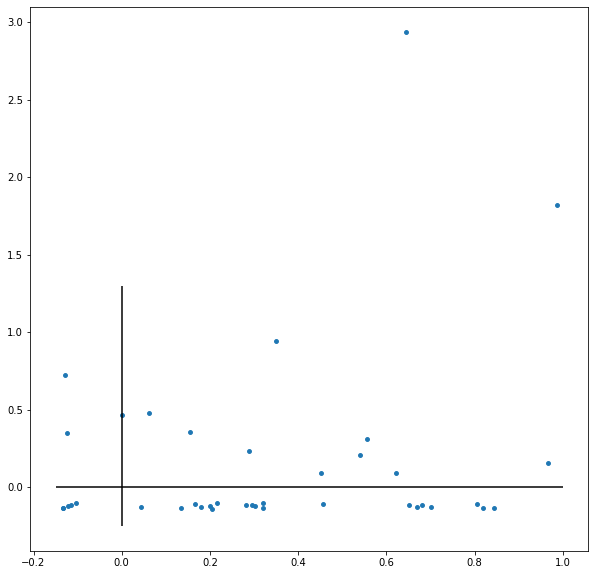

In [ ]:
plt.figure(figsize=(10,10))
plt.scatter(ca,tio,s=15)
plt.hlines([0],-0.15,1)
plt.vlines([0],-0.25,1.3)
plt.show()